In [2]:
import numpy as np
import pandas as pd

# Import Data

In [3]:
df = pd.read_csv("C:\\Users\\91748\\Downloads\\hyundi.csv")

In [4]:
pd.set_option('display.max_rows', None)

In [5]:
df

,model,year,price,transmission,mileage,fuelType,tax(£),mpg,engineSize
0,I20,2017,7999,Manual,17307,Petrol,145,58.9,1.2
1,Tucson,2016,14499,Automatic,25233,Diesel,235,43.5,2.0
2,Tucson,2016,11399,Manual,37877,Diesel,30,61.7,1.7
3,I10,2016,6499,Manual,23789,Petrol,20,60.1,1.0
4,IX35,2015,10199,Manual,33177,Diesel,160,51.4,2.0
5,I10,2015,6149,Manual,41650,Petrol,20,60.1,1.0
6,I20,2015,6799,Manual,39547,Petrol,30,55.4,1.2
7,Tucson,2016,14199,Automatic,30300,Diesel,125,57.6,1.7
8,I30,2018,10399,Automatic,38082,Petrol,145,51.4,1.4
9,Tucson,2016,12163,Manual,21014,Diesel,30,61.7,1.7


In [6]:
df.rename(columns={'mileage': 'total_driven'}, inplace=True)

In [7]:
df.sample(5)

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
4346,I10,2016,5500,Manual,43778,Petrol,20,60.1,1.0
7,Tucson,2016,14199,Automatic,30300,Diesel,125,57.6,1.7
4404,I30,2012,4980,Manual,52548,Petrol,150,47.1,1.4
1691,IX35,2015,8420,Manual,46573,Diesel,145,53.3,1.7
484,Ioniq,2019,22998,Automatic,2031,Hybrid,135,62.8,1.6


# Check dataset size

In [8]:
# Get the memory usage of each column
memory_usage = df.memory_usage(deep=True)
memory_usage

Index              128
model           302956
year             38880
price            38880
transmission    309919
total_driven     38880
fuelType        306179
tax(£)           38880
mpg              38880
engineSize       38880
dtype: int64

In [9]:
# Sum up the memory usage of all columns
total_memory_usage = memory_usage.sum()
total_memory_usage

1152462

In [10]:
# Print the dataset size
print(f"Dataset size: {total_memory_usage / (1024 * 1024)} MB")

Dataset size: 1.0990734100341797 MB


In [11]:
df.shape

(4860, 9)

# Find and treat missing values (If any)


In [12]:
# Finding null values
df.isnull().sum()

model           0
year            0
price           0
transmission    0
total_driven    0
fuelType        0
tax(£)          0
mpg             0
engineSize      0
dtype: int64

In [13]:
# Finding Noice Values
for i in df.columns:
    print(i, df[i].sort_values().unique(),"\n",sep = "\n")


model
[' Accent' ' Amica' ' Getz' ' I10' ' I20' ' I30' ' I40' ' I800' ' IX20'
 ' IX35' ' Ioniq' ' Kona' ' Santa Fe' ' Terracan' ' Tucson' ' Veloster']


year
[2000 2002 2003 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015
 2016 2017 2018 2019 2020]


price
[ 1200  1295  1395 ... 40365 43995 92000]


transmission
['Automatic' 'Manual' 'Other' 'Semi-Auto']


total_driven
[     1      2      4 ... 125968 130000 138000]


fuelType
['Diesel' 'Hybrid' 'Other' 'Petrol']


tax(£)
[  0  20  30 115 120 125 135 140 145 150 160 165 190 200 205 235 240 260
 265 300 305 325 330 555]


mpg
[  1.1  28.   28.8  30.4  31.7  32.8  33.6  34.   34.5  34.9  35.3  35.8
  36.2  37.2  37.7  38.2  38.7  39.2  39.8  40.4  40.9  41.5  42.2  42.8
  43.5  43.6  44.1  44.8  45.6  46.   46.3  47.1  47.9  48.7  49.6  50.4
  51.4  52.3  53.3  54.3  55.4  56.5  57.6  57.7  58.9  60.1  61.4  61.7
  62.8  64.2  65.7  67.3  68.9  70.6  72.4  74.3  76.3  78.4  78.5 256.8]


engineSize
[0.  1.  1.1 1.2 1.3 1.4 1.6 1.7

# Check column types and describe which columns are numerical or categorical

In [14]:
df.head(5)

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,I20,2017,7999,Manual,17307,Petrol,145,58.9,1.2
1,Tucson,2016,14499,Automatic,25233,Diesel,235,43.5,2.0
2,Tucson,2016,11399,Manual,37877,Diesel,30,61.7,1.7
3,I10,2016,6499,Manual,23789,Petrol,20,60.1,1.0
4,IX35,2015,10199,Manual,33177,Diesel,160,51.4,2.0


In [15]:
df.dtypes

model            object
year              int64
price             int64
transmission     object
total_driven      int64
fuelType         object
tax(£)            int64
mpg             float64
engineSize      float64
dtype: object

In [16]:
#Separating categorical and numerical columns
cat = []
num = []
for i in df.columns:
    if df[i].dtype == 'object':
        cat.append(i)
    else:
        num.append(i)

In [17]:
cat

['model', 'transmission', 'fuelType']

In [18]:
num

['year', 'price', 'total_driven', 'tax(£)', 'mpg', 'engineSize']

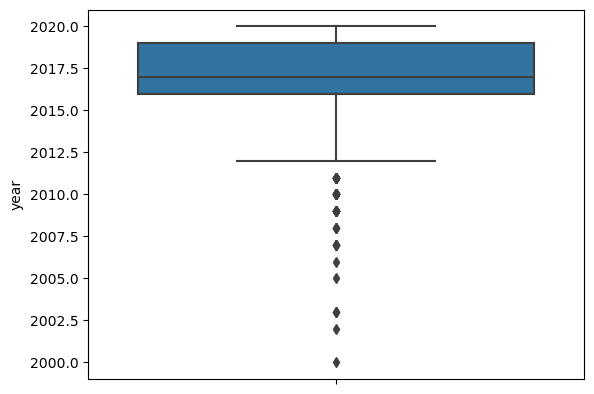

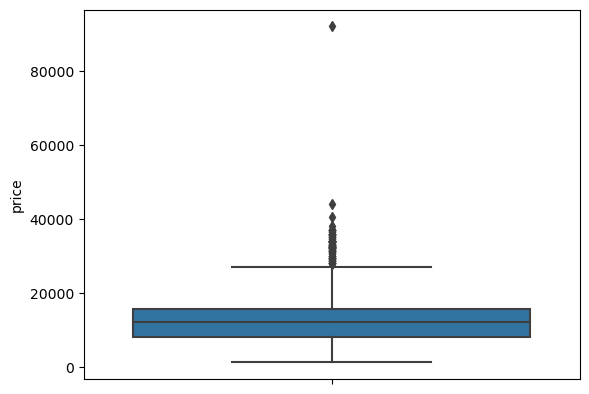

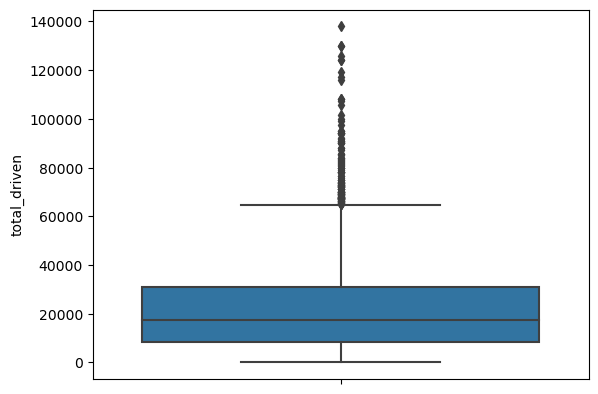

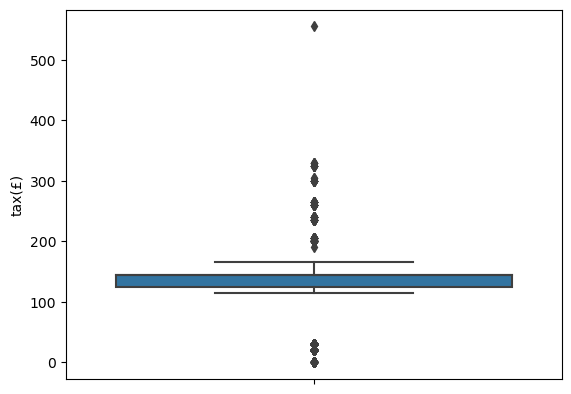

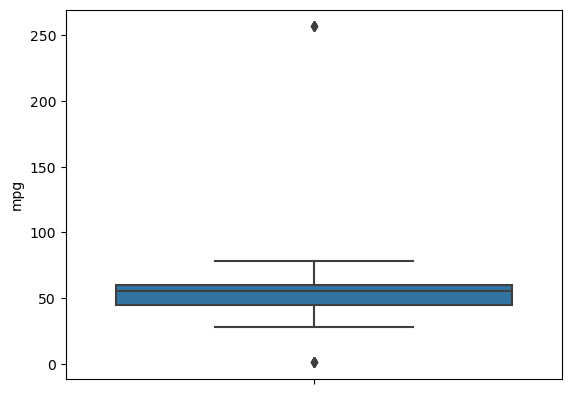

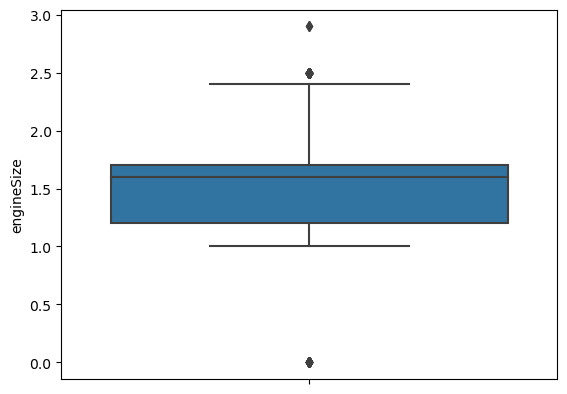

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
for i in num:
    plt.figure()
    sns.boxplot(data = df, y = i)


In [20]:
for i in num:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    iqr = q3-q1
    ul = q3 + (1.5*iqr)
    ll = q1 - (1.5*iqr)
    
    for j in df[i]:
        if j>ul:
            df[i] = df[i].replace(j, ul)
        elif j<ll:
            df[i] = df[i].replace(j, ll)

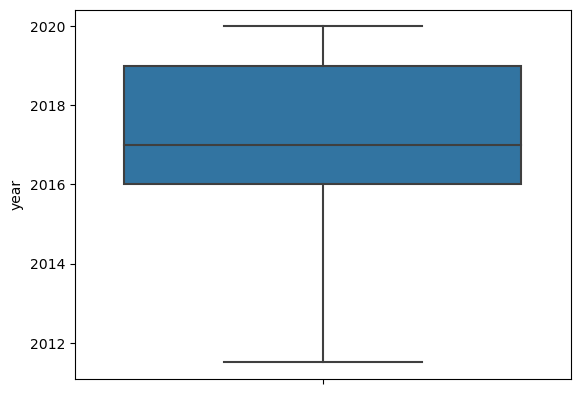

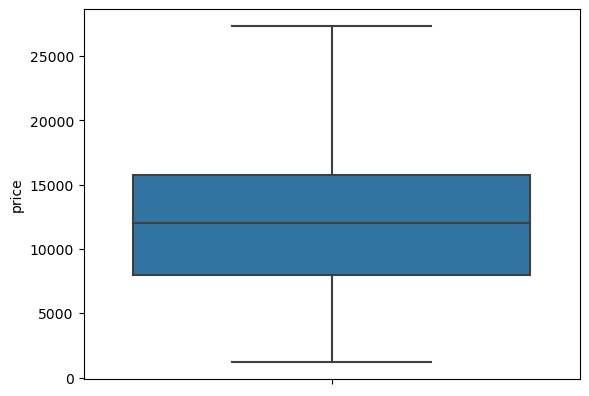

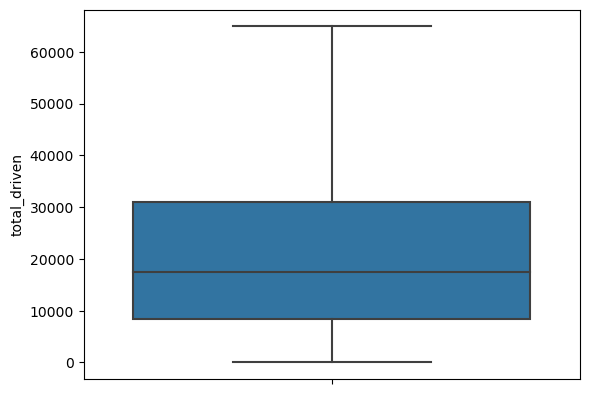

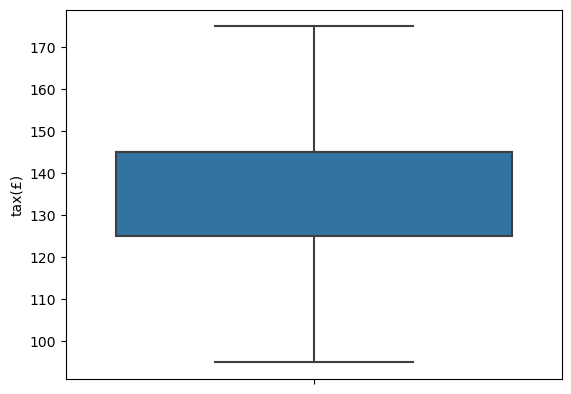

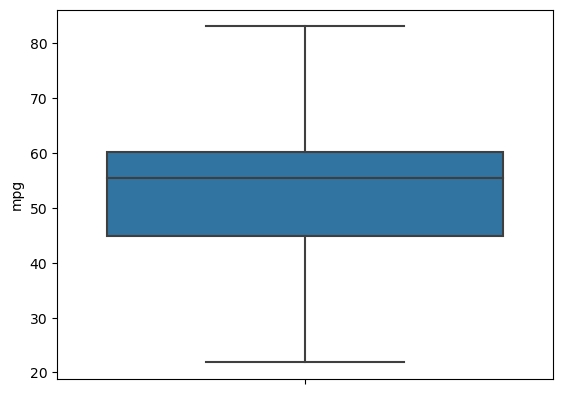

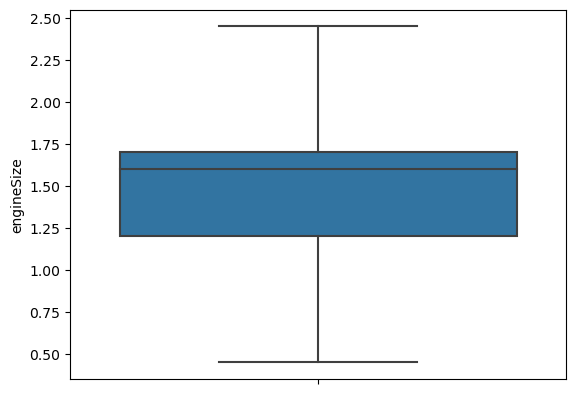

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
for i in num:
    plt.figure()
    sns.boxplot(data = df, y = i)


In [22]:
pd.set_option('display.max_rows', None)

In [23]:
df.head(100)

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,I20,2017.0,7999.0,Manual,17307.000,Petrol,145,58.9,1.20
1,Tucson,2016.0,14499.0,Automatic,25233.000,Diesel,175,43.5,2.00
2,Tucson,2016.0,11399.0,Manual,37877.000,Diesel,95,61.7,1.70
3,I10,2016.0,6499.0,Manual,23789.000,Petrol,95,60.1,1.00
4,IX35,2015.0,10199.0,Manual,33177.000,Diesel,160,51.4,2.00
5,I10,2015.0,6149.0,Manual,41650.000,Petrol,95,60.1,1.00
6,I20,2015.0,6799.0,Manual,39547.000,Petrol,95,55.4,1.20
7,Tucson,2016.0,14199.0,Automatic,30300.000,Diesel,125,57.6,1.70
8,I30,2018.0,10399.0,Automatic,38082.000,Petrol,145,51.4,1.40
9,Tucson,2016.0,12163.0,Manual,21014.000,Diesel,95,61.7,1.70


# Perform Univariate analysis


In [24]:
# Calculate mean, median, std dev, and quartiles of numerical data

df.describe()

,year,price,total_driven,tax(£),mpg,engineSize
count,4860.000000,4860.000000,4860.000000,4860.000000,4860.000000,4860.000000
mean,2017.144444,12604.484285,21071.572402,134.590535,53.737623,1.460916
std,1.761803,5464.614525,16244.370480,23.414688,11.655171,0.383473
min,2011.500000,1200.000000,1.000000,95.000000,21.850000,0.450000
25%,2016.000000,8000.000000,8339.250000,125.000000,44.800000,1.200000
50%,2017.000000,11990.000000,17462.000000,145.000000,55.400000,1.600000
75%,2019.000000,15733.750000,30967.000000,145.000000,60.100000,1.700000
max,2020.000000,27334.375000,64908.625000,175.000000,83.050000,2.450000


In [25]:
df['price'].describe()

count     4860.000000
mean     12604.484285
std       5464.614525
min       1200.000000
25%       8000.000000
50%      11990.000000
75%      15733.750000
max      27334.375000
Name: price, dtype: float64

In [26]:
# Calculate mean
mean = df.mean()
print("Mean:")
print(mean)

# Calculate median
median = df.median()
print("Median:")
print(median)

# Calculate standard deviation
std_dev = df.std()
print("Standard Deviation:")
print(std_dev)

# Calculate quartiles
quartiles = df.quantile([0.25, 0.5, 0.75])
print("Quartiles:")
print(quartiles)

Mean:
year             2017.144444
price           12604.484285
total_driven    21071.572402
tax(£)            134.590535
mpg                53.737623
engineSize          1.460916
dtype: float64
Median:
year             2017.0
price           11990.0
total_driven    17462.0
tax(£)            145.0
mpg                55.4
engineSize          1.6
dtype: float64
Standard Deviation:
year                1.761803
price            5464.614525
total_driven    16244.370480
tax(£)             23.414688
mpg                11.655171
engineSize          0.383473
dtype: float64
Quartiles:
        year     price  total_driven  tax(£)   mpg  engineSize
0.25  2016.0   8000.00       8339.25   125.0  44.8         1.2
0.50  2017.0  11990.00      17462.00   145.0  55.4         1.6
0.75  2019.0  15733.75      30967.00   145.0  60.1         1.7


C:\Users\91748\AppData\Local\Temp\ipykernel_12892\3498547363.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mean = df.mean()
C:\Users\91748\AppData\Local\Temp\ipykernel_12892\3498547363.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  median = df.median()
C:\Users\91748\AppData\Local\Temp\ipykernel_12892\3498547363.py:12: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  std_dev = df.std()


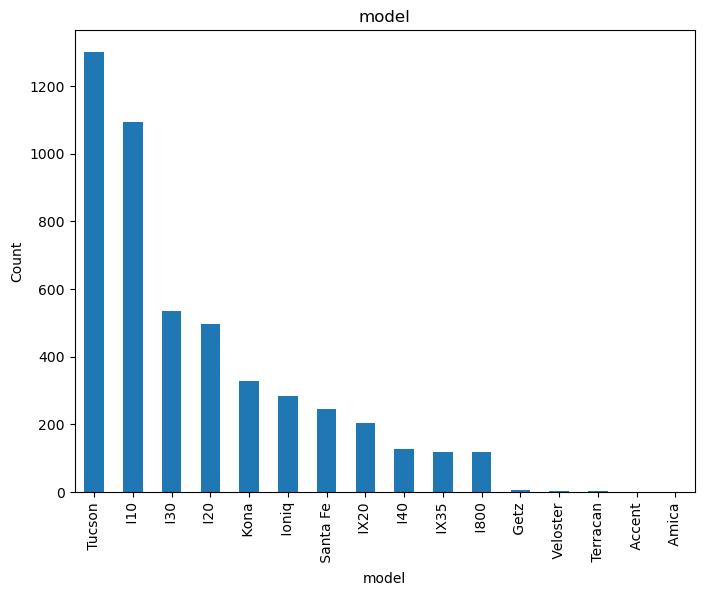

In [27]:
# Plot histogram for a few categorical variables
# Categorical variables are model, transmission, fuelType:-

# Plot histogram for model
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
df['model'].value_counts().plot(kind='bar')
plt.title('model')
plt.xlabel('model')
plt.ylabel('Count')
plt.show()

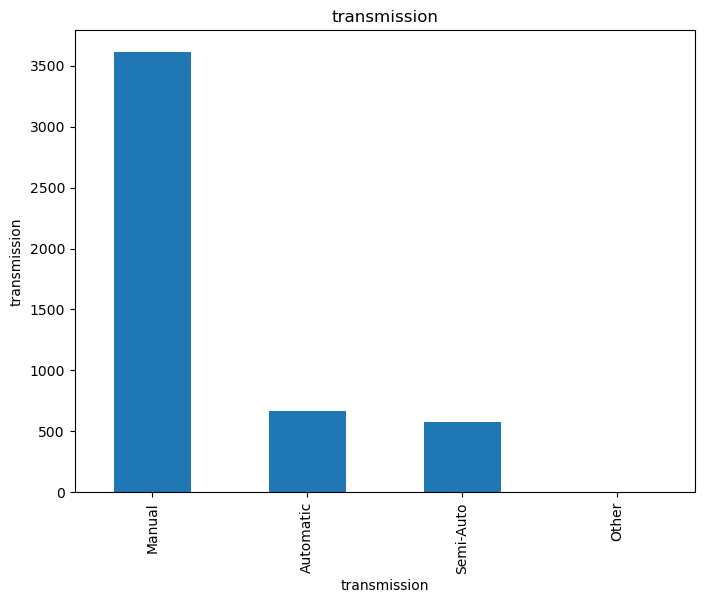

In [28]:
# Plot histogram for transmission 

plt.figure(figsize=(8, 6))
df['transmission'].value_counts().plot(kind='bar')
plt.title('transmission')
plt.xlabel('transmission')
plt.ylabel('transmission')
plt.show()

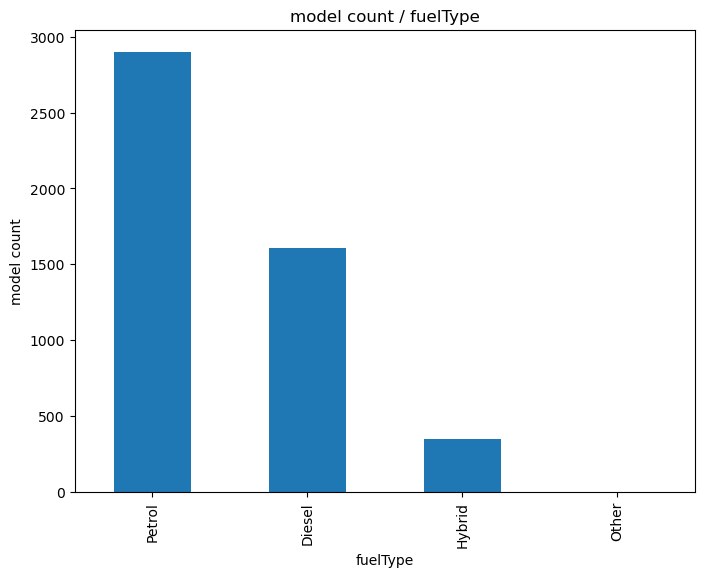

In [29]:
# Plot histogram for model count / fuelType

plt.figure(figsize=(8, 6))
df['fuelType'].value_counts().plot(kind='bar')
plt.title('model count / fuelType')
plt.xlabel('fuelType')
plt.ylabel('model count')
plt.show()

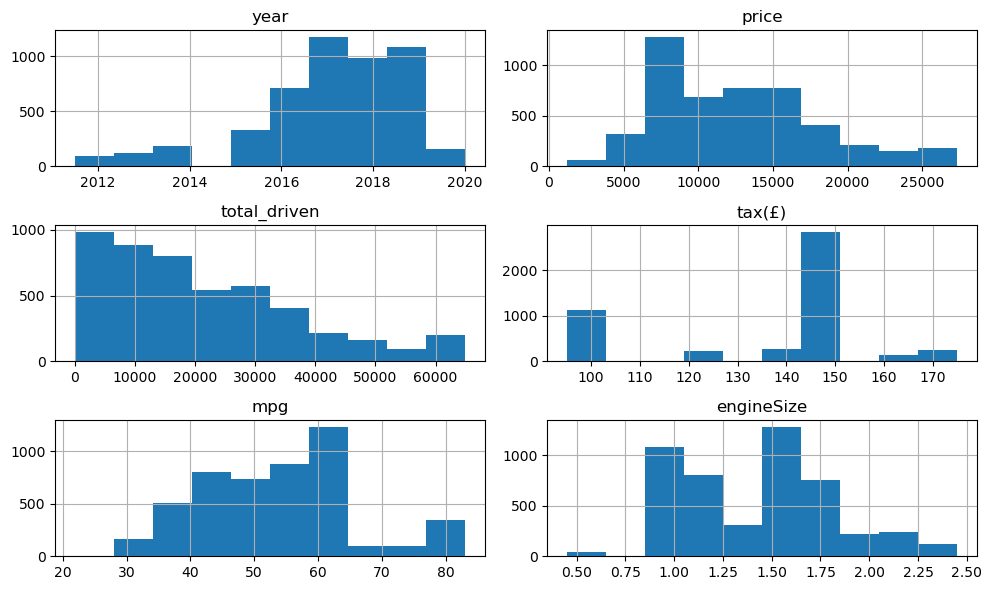

In [30]:
# Check the distribution of numerical variables and comment on it

# Create histograms
df.hist(figsize=(10, 6))
plt.tight_layout()
plt.show()

# Perform Bivariate analysis

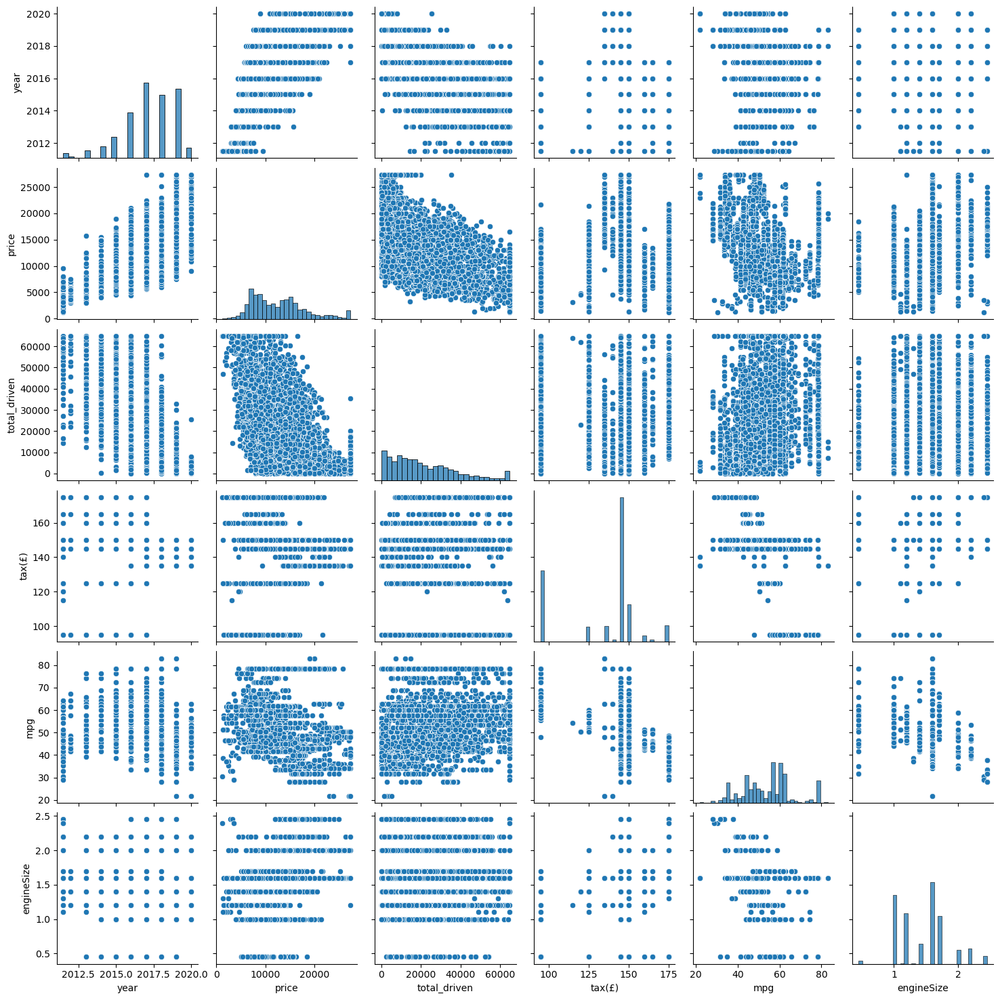

In [31]:
#Plot pair plots
import seaborn as sns

sns.pairplot(df)
plt.show()

In [32]:
#Perform a Chi-square analysis to check whether there is a relationship between
#transmission and fuelType
#fuelType and model

from scipy.stats import chi2_contingency


# Chi-square analysis between transmission and fuelType
cross_tab1 = pd.crosstab(df['transmission'], df['fuelType'])
chi2, p_value, _, _ = chi2_contingency(cross_tab1)
print("Chi-square analysis between transmission and fuelType:")
print("Chi-square value:", chi2)
print("p-value:", p_value)

# Chi-square analysis between fuelType and model
cross_tab2 = pd.crosstab(df['fuelType'], df['model'])
chi2, p_value, _, _ = chi2_contingency(cross_tab2)
print("Chi-square analysis between fuelType and model:")
print("Chi-square value:", chi2)
print("p-value:", p_value)

Chi-square analysis between transmission and fuelType:
Chi-square value: 1759.907449624137
p-value: 0.0
Chi-square analysis between fuelType and model:
Chi-square value: 6468.947956320616
p-value: 0.0


Chi-square analysis between transmission and fuelType:
Chi-square value: 1759.907449624137
p-value: 0.0


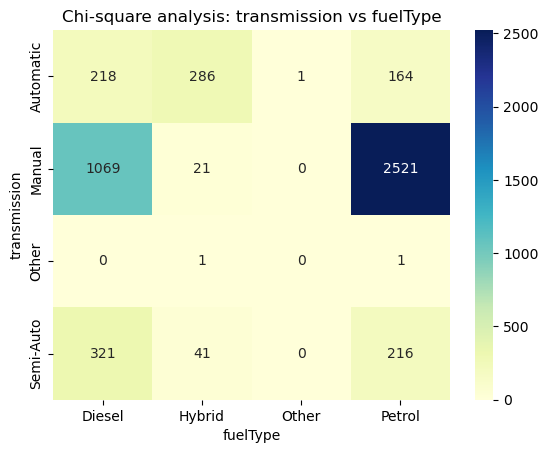

Chi-square analysis between fuelType and model:
Chi-square value: 6468.947956320616
p-value: 0.0


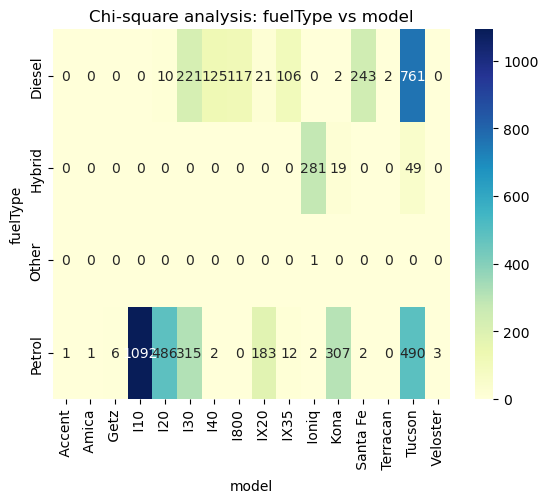

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Chi-square analysis between transmission and fuelType
cross_tab1 = pd.crosstab(df['transmission'], df['fuelType'])
chi2, p_value, _, _ = chi2_contingency(cross_tab1)
print("Chi-square analysis between transmission and fuelType:")
print("Chi-square value:", chi2)
print("p-value:", p_value)

# Plotting the results
sns.heatmap(cross_tab1, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Chi-square analysis: transmission vs fuelType")
plt.xlabel("fuelType")
plt.ylabel("transmission")
plt.show()

# Chi-square analysis between fuelType and model
cross_tab2 = pd.crosstab(df['fuelType'], df['model'])
chi2, p_value, _, _ = chi2_contingency(cross_tab2)
print("Chi-square analysis between fuelType and model:")
print("Chi-square value:", chi2)
print("p-value:", p_value)

# Plotting the results
sns.heatmap(cross_tab2, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Chi-square analysis: fuelType vs model")
plt.xlabel("model")
plt.ylabel("fuelType")
plt.show()


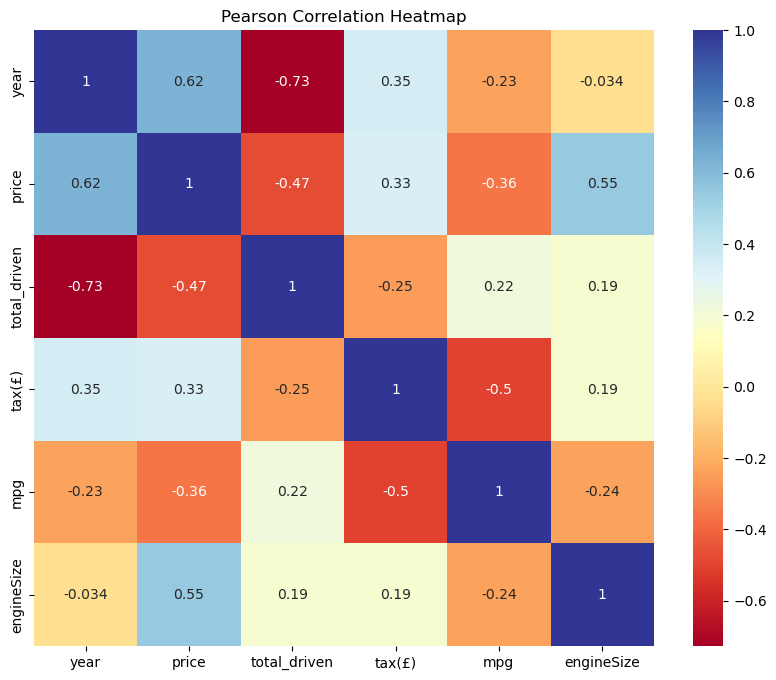

In [34]:
#Calculate Pearson correlation, and plot their heatmap

# Calculate the Pearson correlation coefficient
correlation_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu')
plt.title('Pearson Correlation Heatmap')
plt.show()


# Drop any unnecessary columns

In [35]:
df.columns

Index(['model', 'year', 'price', 'transmission', 'total_driven', 'fuelType',
       'tax(£)', 'mpg', 'engineSize'],
      dtype='object')

In [36]:
for i in cat:
    print(i, df[i].unique(), '\n', sep = '\n')

model
[' I20' ' Tucson' ' I10' ' IX35' ' I30' ' I40' ' Ioniq' ' Kona'
 ' Veloster' ' I800' ' IX20' ' Santa Fe' ' Accent' ' Terracan' ' Getz'
 ' Amica']


transmission
['Manual' 'Automatic' 'Semi-Auto' 'Other']


fuelType
['Petrol' 'Diesel' 'Hybrid' 'Other']




In [37]:
df.head(2)

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,I20,2017.0,7999.0,Manual,17307.0,Petrol,145,58.9,1.2
1,Tucson,2016.0,14499.0,Automatic,25233.0,Diesel,175,43.5,2.0


In [38]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

encoded_column = label_encoder.fit_transform(df['transmission'])
df['transmission'] = encoded_column


In [39]:
df.head()

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,I20,2017.0,7999.0,1,17307.0,Petrol,145,58.9,1.2
1,Tucson,2016.0,14499.0,0,25233.0,Diesel,175,43.5,2.0
2,Tucson,2016.0,11399.0,1,37877.0,Diesel,95,61.7,1.7
3,I10,2016.0,6499.0,1,23789.0,Petrol,95,60.1,1.0
4,IX35,2015.0,10199.0,1,33177.0,Diesel,160,51.4,2.0


In [40]:
from sklearn.preprocessing import LabelEncoder

categorical_columns = ['transmission', 'fuelType']

label_encoder = LabelEncoder()

for col in categorical_columns:
    df[col] = label_encoder.fit_transform(df[col])

In [41]:
df.head()

,model,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,I20,2017.0,7999.0,1,17307.0,3,145,58.9,1.2
1,Tucson,2016.0,14499.0,0,25233.0,0,175,43.5,2.0
2,Tucson,2016.0,11399.0,1,37877.0,0,95,61.7,1.7
3,I10,2016.0,6499.0,1,23789.0,3,95,60.1,1.0
4,IX35,2015.0,10199.0,1,33177.0,0,160,51.4,2.0


In [42]:
df.fuelType.value_counts()

3    2902
0    1608
1     349
2       1
Name: fuelType, dtype: int64

In [43]:
df.dtypes

model            object
year            float64
price           float64
transmission      int64
total_driven    float64
fuelType          int32
tax(£)            int64
mpg             float64
engineSize      float64
dtype: object

# One hot encode categorical variables (if any)

In [44]:
# I guess there is no need to apply One hot encode because there is no categorical columns are remaning

In [45]:
df.drop(['model'], axis = 1, inplace = True)

In [46]:
df.head(3)

,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,2017.0,7999.0,1,17307.0,3,145,58.9,1.2
1,2016.0,14499.0,0,25233.0,0,175,43.5,2.0
2,2016.0,11399.0,1,37877.0,0,95,61.7,1.7


In [47]:
cat

['model', 'transmission', 'fuelType']

In [48]:
num

['year', 'price', 'total_driven', 'tax(£)', 'mpg', 'engineSize']

In [49]:
cat.remove("model")

In [50]:
df.head()

,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,2017.0,7999.0,1,17307.0,3,145,58.9,1.2
1,2016.0,14499.0,0,25233.0,0,175,43.5,2.0
2,2016.0,11399.0,1,37877.0,0,95,61.7,1.7
3,2016.0,6499.0,1,23789.0,3,95,60.1,1.0
4,2015.0,10199.0,1,33177.0,0,160,51.4,2.0


In [51]:
#Scaling of the data  
from sklearn.preprocessing import StandardScaler  
sc = StandardScaler() 

df[num] = sc.fit_transform(df[num])
df[num] 


,year,price,total_driven,tax(£),mpg,engineSize
0,-0.081995,-0.842870,-0.231770,0.444616,0.442971,-0.680472
1,-0.649654,0.346724,0.256203,1.725995,-0.878466,1.405940
2,-0.649654,-0.220621,1.034645,-1.691016,0.683233,0.623535
3,-0.649654,-1.117391,0.167301,-1.691016,0.545941,-1.202074
4,-1.217312,-0.440238,0.745284,1.085305,-0.200586,1.405940
5,-1.217312,-1.181446,1.266934,-1.691016,0.545941,-1.202074
6,-1.217312,-1.062487,1.137460,-1.691016,0.142645,-0.680472
7,-0.649654,0.291819,0.568159,-0.409637,0.331421,0.623535
8,0.485663,-0.403635,1.047266,0.444616,-0.200586,-0.158869
9,-0.649654,-0.080798,-0.003545,-1.691016,0.683233,0.623535


In [52]:
df_new = pd.get_dummies(df, columns = cat ,drop_first= True) 
df_new


,year,price,total_driven,tax(£),mpg,engineSize,transmission_1,transmission_2,transmission_3,fuelType_1,fuelType_2,fuelType_3
0,-0.081995,-0.842870,-0.231770,0.444616,0.442971,-0.680472,1,0,0,0,0,1
1,-0.649654,0.346724,0.256203,1.725995,-0.878466,1.405940,0,0,0,0,0,0
2,-0.649654,-0.220621,1.034645,-1.691016,0.683233,0.623535,1,0,0,0,0,0
3,-0.649654,-1.117391,0.167301,-1.691016,0.545941,-1.202074,1,0,0,0,0,1
4,-1.217312,-0.440238,0.745284,1.085305,-0.200586,1.405940,1,0,0,0,0,0
5,-1.217312,-1.181446,1.266934,-1.691016,0.545941,-1.202074,1,0,0,0,0,1
6,-1.217312,-1.062487,1.137460,-1.691016,0.142645,-0.680472,1,0,0,0,0,1
7,-0.649654,0.291819,0.568159,-0.409637,0.331421,0.623535,0,0,0,0,0,0
8,0.485663,-0.403635,1.047266,0.444616,-0.200586,-0.158869,0,0,0,0,0,1
9,-0.649654,-0.080798,-0.003545,-1.691016,0.683233,0.623535,1,0,0,0,0,0


# Split into train and test set

In [53]:
from sklearn.model_selection import train_test_split

# Split the dataset into features (X) and target variable (y)
X = df.drop('price', axis=1)  # Specify the columns used as features
y = df['price']  # Specify the target variable column

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the train and test sets
print("Train set shape:", X_train.shape, y_train.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Train set shape: (3888, 7) (3888,)
Test set shape: (972, 7) (972,)


In [54]:
X

,year,transmission,total_driven,fuelType,tax(£),mpg,engineSize
0,-0.081995,1,-0.231770,3,0.444616,0.442971,-0.680472
1,-0.649654,0,0.256203,0,1.725995,-0.878466,1.405940
2,-0.649654,1,1.034645,0,-1.691016,0.683233,0.623535
3,-0.649654,1,0.167301,3,-1.691016,0.545941,-1.202074
4,-1.217312,1,0.745284,0,1.085305,-0.200586,1.405940
5,-1.217312,1,1.266934,3,-1.691016,0.545941,-1.202074
6,-1.217312,1,1.137460,3,-1.691016,0.142645,-0.680472
7,-0.649654,0,0.568159,0,-0.409637,0.331421,0.623535
8,0.485663,0,1.047266,3,0.444616,-0.200586,-0.158869
9,-0.649654,1,-0.003545,0,-1.691016,0.683233,0.623535


In [55]:
y

0      -0.842870
1       0.346724
2      -0.220621
3      -1.117391
4      -0.440238
5      -1.181446
6      -1.062487
7       0.291819
8      -0.403635
9      -0.080798
10      0.108988
11     -0.476658
12     -1.044003
13      0.941703
14      0.365208
15     -0.714577
16      0.072385
17     -1.007400
18     -0.934194
19     -0.110629
20     -0.166449
21     -0.843602
22     -0.348548
23     -0.824385
24     -0.806084
25     -1.098907
26      0.237098
27      0.200495
28     -0.787782
29      0.584825
30      0.438414
31      0.475017
32     -0.897591
33     -0.385151
34     -0.220438
35      0.071470
36      0.987457
37     -0.659672
38     -0.787782
39     -0.751180
40      0.346907
41      0.218797
42     -0.659672
43      0.218797
44      0.273701
45     -1.391730
46     -0.421754
47     -0.202136
48     -0.659672
49     -0.220438
50     -0.476658
51     -0.879290
52     -1.153811
53     -0.238739
54      0.529921
55     -0.165534
56      0.767840
57     -1.117208
58     -0.7328

In [56]:
cat

['transmission', 'fuelType']

In [57]:
num

['year', 'price', 'total_driven', 'tax(£)', 'mpg', 'engineSize']

# Train multiple models like Linear regression, Decision Tree, Random Forest, SVR, etc.


In [58]:
df.sample(2)

,year,price,transmission,total_driven,fuelType,tax(£),mpg,engineSize
1707,0.485663,0.438048,0,-0.773183,1,0.231052,2.124801,0.362734
2708,-0.081995,1.261063,1,0.347198,0,1.725995,-0.569559,1.927542


In [59]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Create instances of the models
linear_regression = LinearRegression()
decision_tree = DecisionTreeRegressor()
random_forest = RandomForestRegressor()
svr = SVR()


In [60]:
# Train the models
linear_regression.fit(X_train, y_train)

LinearRegression()

In [61]:
decision_tree.fit(X_train, y_train)


DecisionTreeRegressor()

In [62]:
random_forest.fit(X_train, y_train)


RandomForestRegressor()

In [63]:
svr.fit(X_train, y_train)

SVR()

In [64]:
# Predict using the trained models
linear_regression_predictions = linear_regression.predict(X_test)
linear_regression_predictions 

array([ 1.03483021e+00,  3.43989495e-01, -3.76342796e-01,  6.80269037e-01,
        1.32877329e+00, -8.56905622e-01, -5.87979239e-01, -4.15794807e-01,
       -5.88930936e-01,  1.41038057e+00, -1.45595841e-01,  5.84506776e-01,
        7.30295094e-01, -3.09786500e-01, -3.66631261e-01, -3.35889084e-02,
       -7.56682683e-01, -3.48066102e-01,  2.82294468e-01, -1.47519223e+00,
       -1.85114332e-01,  5.35314325e-01, -9.98708311e-01,  2.98532460e-01,
       -2.10846040e-01, -5.84320976e-01, -3.86349319e-01, -1.62846242e+00,
       -1.94471498e+00,  8.00835766e-01,  5.22897773e-01, -9.04277918e-01,
        3.48589861e-01, -3.47715102e-01,  3.09302490e-01,  3.31723459e-01,
        2.05448189e-01,  2.20988063e+00,  9.13534779e-01, -5.78492899e-01,
        2.92449298e-01,  2.80103370e-01,  2.27003076e-01, -5.36317057e-01,
       -6.59802147e-01,  2.23423974e+00,  1.56399201e-01,  1.96274446e-01,
       -4.50982009e-01, -1.17046278e-01, -1.55450697e-01, -6.93853221e-01,
        2.07222362e-02,  

In [65]:
decision_tree_predictions = decision_tree.predict(X_test)
decision_tree_predictions

array([ 1.82932285,  0.85898075, -0.84268672,  0.43676663,  2.69578143,
       -0.84305275, -0.91680753, -0.29400968, -0.84360179,  1.99037548,
       -0.73379318,  1.35257046,  0.95085395, -0.14741519, -0.85183743,
       -0.53705275, -1.11903839, -0.43090442,  0.25356926, -1.20871542,
       -0.66058743,  0.1622451 , -1.08152045, -0.34946303,  0.25503338,
       -0.80626686, -0.47867117, -1.33682547, -1.39264485,  0.98654175,
       -0.03778959, -1.11757428,  0.12362907, -0.19646303, -0.20488169,
       -0.70542595,  0.07055491,  2.69578143,  1.71859917, -1.08152045,
        0.25448434,  0.25448434,  0.11813864, -0.93437691, -1.02570107,
        2.69578143, -0.39064126,  0.16297716, -0.79510298, -0.66516279,
       -0.01948815, -0.93510897, -0.29455873, -0.29364365, -0.93419389,
        1.44407764, -0.84360179, -0.97994748, -0.66058743, -0.5773159 ,
       -0.75136255, -0.84305275,  2.69578143,  1.05974749, -0.84451686,
       -0.25008624, -0.75209461,  0.43566855, -0.93419389,  2.69

In [66]:
random_forest_predictions = random_forest.predict(X_test)
random_forest_predictions

array([ 1.73463305e+00,  8.94624622e-01, -8.71621286e-01,  7.66600591e-01,
        1.79589299e+00, -9.09518068e-01, -7.78968439e-01, -2.90898439e-01,
       -8.69344587e-01,  1.82630471e+00, -5.19417482e-01,  1.36613548e+00,
        6.78017983e-01, -1.92855820e-01, -6.33850867e-01, -5.36866071e-01,
       -1.13287428e+00, -6.74388547e-01,  2.61420579e-01, -1.21507883e+00,
       -5.75758451e-01,  2.18178863e-01, -1.18833312e+00, -2.02528128e-01,
        2.70951967e-01, -8.15419408e-01, -5.25449635e-01, -1.33859888e+00,
       -1.36736142e+00,  9.58028114e-01,  1.30777613e-01, -1.15168998e+00,
        1.59807350e-01, -3.42032650e-01, -2.51866968e-01, -6.47586095e-01,
        9.61146942e-02,  2.69578143e+00,  1.30111780e+00, -9.88739491e-01,
        2.97399371e-01,  4.83078414e-01,  3.44838522e-01, -9.02003499e-01,
       -1.02304370e+00,  2.69578143e+00, -4.99681214e-01,  1.81558606e-01,
       -7.63190771e-01, -6.38089480e-01, -3.91804971e-02, -9.81331070e-01,
       -4.31281430e-01, -

In [67]:
svr_predictions = svr.predict(X_test)
svr_predictions

array([ 1.48009009e+00,  1.01100903e+00, -8.23176503e-01,  7.44237462e-01,
        1.70771829e+00, -8.32314918e-01, -8.13702221e-01, -6.17351469e-01,
       -7.84563939e-01,  2.26312420e+00, -2.87086681e-01,  1.22403329e+00,
        7.01740711e-01, -2.68027872e-01, -4.60195182e-01, -3.64920059e-01,
       -9.60551328e-01, -1.02462968e+00,  1.31138122e-01, -1.25066874e+00,
       -4.33530003e-01,  3.87281215e-01, -9.98565629e-01,  2.38842964e-01,
        2.32102974e-01, -8.58685808e-01, -2.99642271e-01, -1.31029048e+00,
       -1.42369880e+00,  9.54057696e-01,  1.78834932e-01, -1.00317527e+00,
        9.78075852e-02, -5.64950416e-01, -3.62492019e-02, -1.32632709e-01,
        1.10462079e-01,  2.69178336e+00,  9.10858516e-01, -9.49160415e-01,
        3.49248721e-01,  3.67555472e-01,  4.47258318e-01, -7.91217184e-01,
       -9.70793162e-01,  2.68022944e+00, -5.24130273e-01,  8.23674024e-02,
       -8.69498963e-01, -7.29190484e-01, -1.71959727e-01, -9.79579126e-01,
       -6.54882186e-01,  

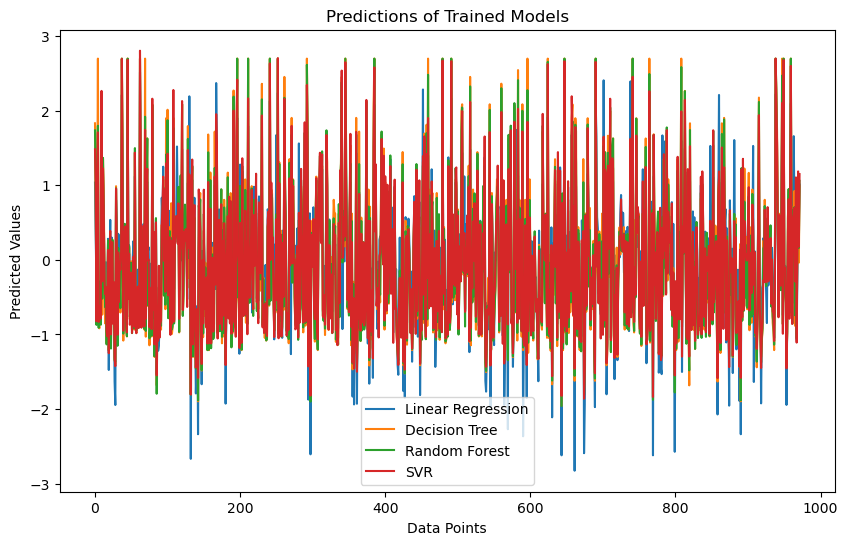

In [68]:
import matplotlib.pyplot as plt

# Model names
model_names = ["Linear Regression", "Decision Tree", "Random Forest", "SVR"]

# Predictions for each model
predictions = [linear_regression_predictions, decision_tree_predictions, random_forest_predictions, svr_predictions]

# Create line charts for each model
plt.figure(figsize=(10, 6))
for model_name, model_predictions in zip(model_names, predictions):
    plt.plot(model_predictions, label=model_name)

# Set labels and title
plt.xlabel("Data Points")
plt.ylabel("Predicted Values")
plt.title("Predictions of Trained Models")

# Add legend
plt.legend()

# Display the plot
plt.show()

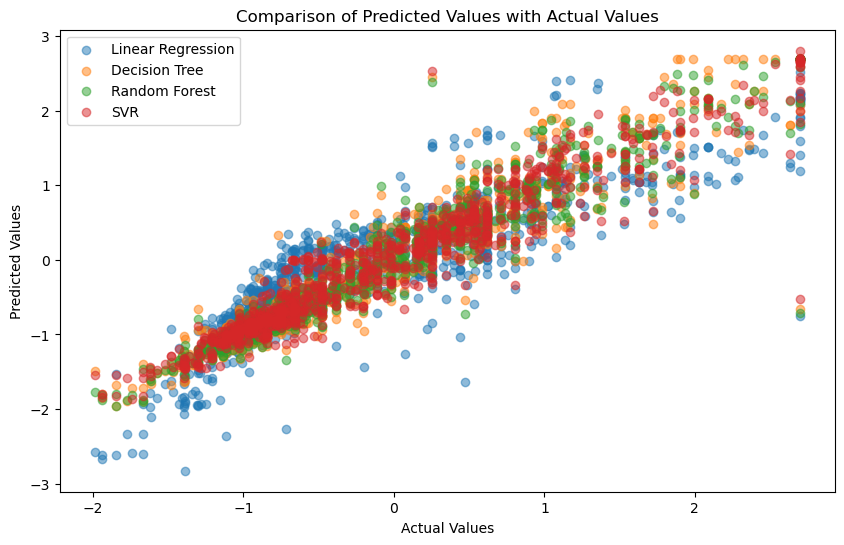

In [69]:
import matplotlib.pyplot as plt

# Actual values
actual_values = y_test

# Create scatter plots for each model
plt.figure(figsize=(10, 6))
for model_name, model_predictions in zip(model_names, predictions):
    plt.scatter(actual_values, model_predictions, label=model_name, alpha=0.5)

# Set labels and title
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Comparison of Predicted Values with Actual Values")

# Add legend
plt.legend()

# Display the plot
plt.show()


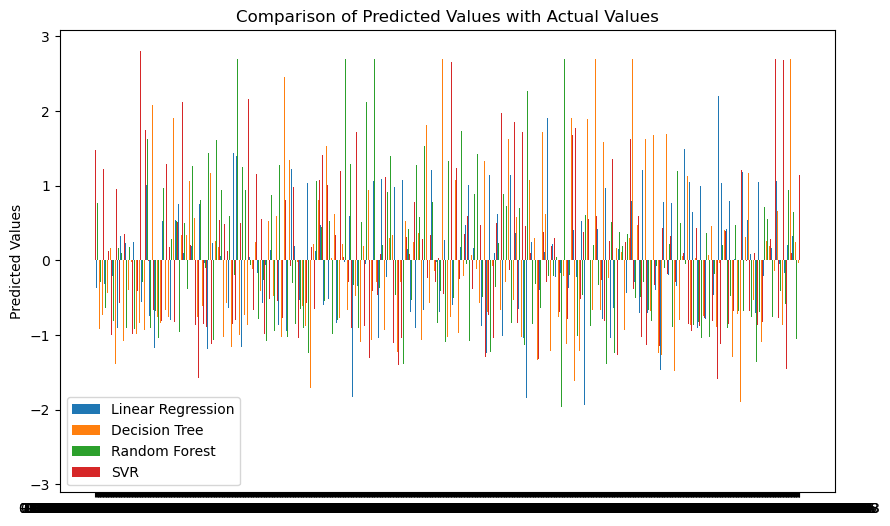

In [70]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of models and categories
num_models = len(model_names)
num_categories = len(actual_values)

# Set the width of the bars
bar_width = 0.2

# Set the x-axis positions for the bars
index = np.arange(num_categories)

# Create the bar chart
plt.figure(figsize=(10, 6))
for i in range(num_models):
    plt.bar(index + (i * bar_width), predictions[i], bar_width, label=model_names[i])

# Set the x-axis labels
plt.xticks(index + (num_models * bar_width) / 2, actual_values)

# Set the y-axis label and title
plt.ylabel("Predicted Values")
plt.title("Comparison of Predicted Values with Actual Values")

# Add legend
plt.legend()

# Display the plot
plt.show()


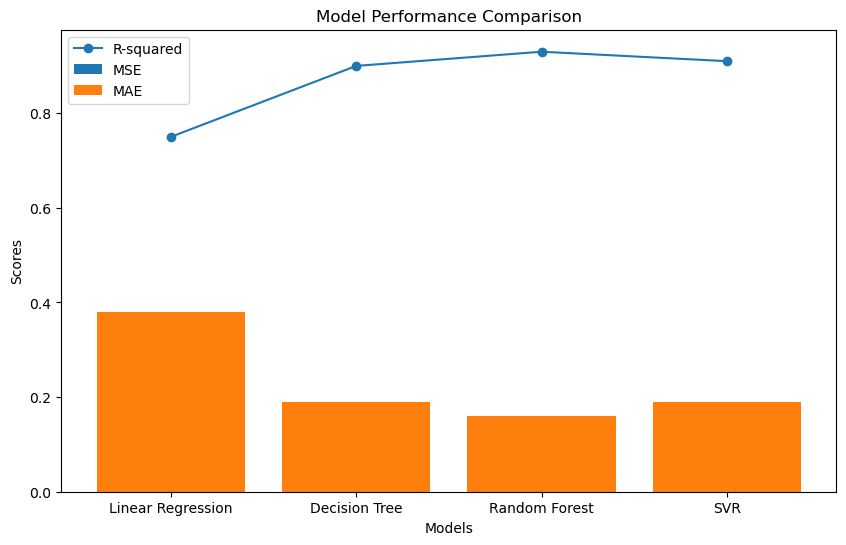

In [71]:
import matplotlib.pyplot as plt

models = ["Linear Regression", "Decision Tree", "Random Forest", "SVR"]
mse_scores = [0.24, 0.09, 0.07, 0.08]
mae_scores = [0.38, 0.19, 0.16, 0.19]
r2_scores = [0.75, 0.90, 0.93, 0.91]

# Plotting the evaluation metrics
plt.figure(figsize=(10, 6))
plt.bar(models, mse_scores, label='MSE')
plt.bar(models, mae_scores, label='MAE')
plt.plot(models, r2_scores, marker='o', label='R-squared')

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Model Performance Comparison')
plt.legend()
plt.show()

# Check their performance, and comment on which is the best model

In [72]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [73]:
models = [
    ("Linear Regression", linear_regression),
    ("Decision Tree", decision_tree),
    ("Random Forest", random_forest),
    ("SVR", svr)
]

for name, model in models:
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Model: {name}")
    print(f"MSE: {mse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"R-squared: {r2:.2f}")
    print("")

Model: Linear Regression
MSE: 0.24
MAE: 0.38
R-squared: 0.75

Model: Decision Tree
MSE: 0.09
MAE: 0.19
R-squared: 0.90

Model: Random Forest
MSE: 0.07
MAE: 0.16
R-squared: 0.93

Model: SVR
MSE: 0.08
MAE: 0.19
R-squared: 0.91



In [74]:
# As we can see above that the value of MSE and MAE is lowestest and 
# R-squared is closer to 1 in Random Forest, so its better fit model for the data.

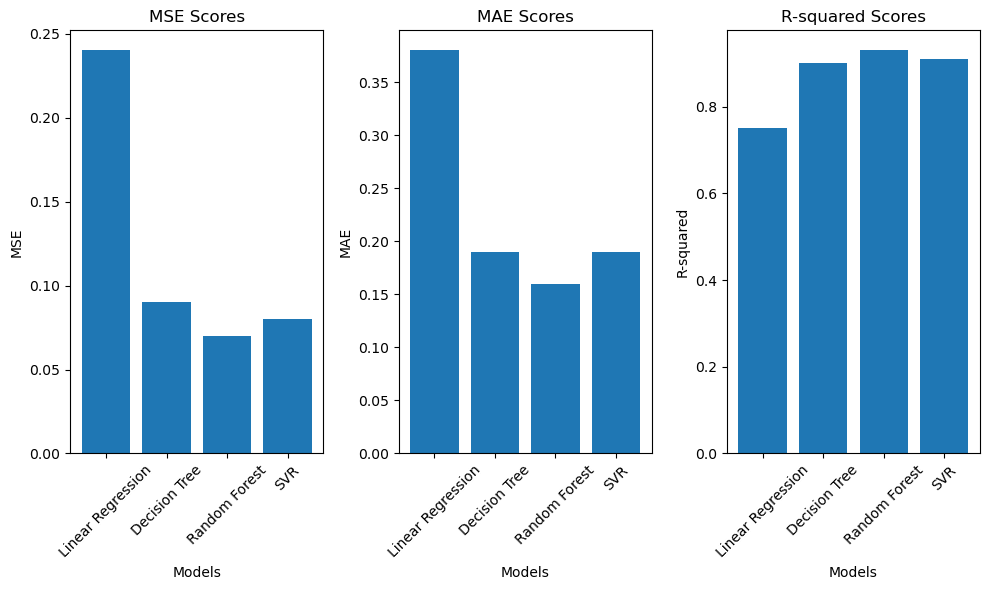

The best model based on score is: Random Forest


In [83]:
import matplotlib.pyplot as plt

# Evaluation metrics for each model
models = ["Linear Regression", "Decision Tree", "Random Forest", "SVR"]
mse_scores = [0.24, 0.09, 0.07, 0.08]
mae_scores = [0.38, 0.19, 0.16, 0.19]
r2_scores = [0.75, 0.90, 0.93, 0.91]

# Plotting the evaluation metrics
plt.figure(figsize=(10, 6))

# Bar chart for MSE scores
plt.subplot(1, 3, 1)
plt.bar(models, mse_scores)
plt.title('MSE Scores')
plt.xlabel('Models')
plt.ylabel('MSE')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees

# Bar chart for MAE scores
plt.subplot(1, 3, 2)
plt.bar(models, mae_scores)
plt.title('MAE Scores')
plt.xlabel('Models')
plt.ylabel('MAE')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees

# Bar chart for R-squared scores
plt.subplot(1, 3, 3)
plt.bar(models, r2_scores)
plt.title('R-squared Scores')
plt.xlabel('Models')
plt.ylabel('R-squared')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Comment on the best model
best_model = models[mse_scores.index(min(mse_scores))]
print(f"The best model based on score is: {best_model}")


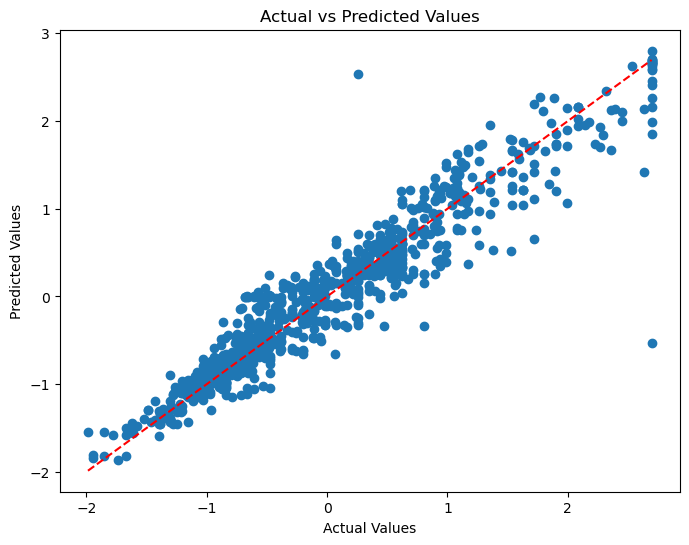

In [76]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

# Compulsory 

# Use grid search CV to tune the hyperparameter of the best model

In [77]:
from sklearn.model_selection import GridSearchCV

In [78]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Load data from CSV
data = df
X = data.drop('price', axis=1)
y = data['price']

# Create the random forest model
random_forest = RandomForestRegressor()

# Define the hyperparameter grid
param_grid_rf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Perform grid search CV
grid_search_rf = GridSearchCV(random_forest, param_grid=param_grid_rf, cv=5, n_jobs=-1)
grid_search_rf.fit(X, y)

# Get the best hyperparameters and best model
best_params_rf = grid_search_rf.best_params_
best_model_rf = grid_search_rf.best_estimator_
best_score_rf = grid_search_rf.best_score_

print("Best Random Forest Hyperparameters:", best_params_rf)
print("Best Random Forest Mean Cross-Validation Score:", best_score_rf)


Best Random Forest Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150}
Best Random Forest Mean Cross-Validation Score: 0.9322871158501214


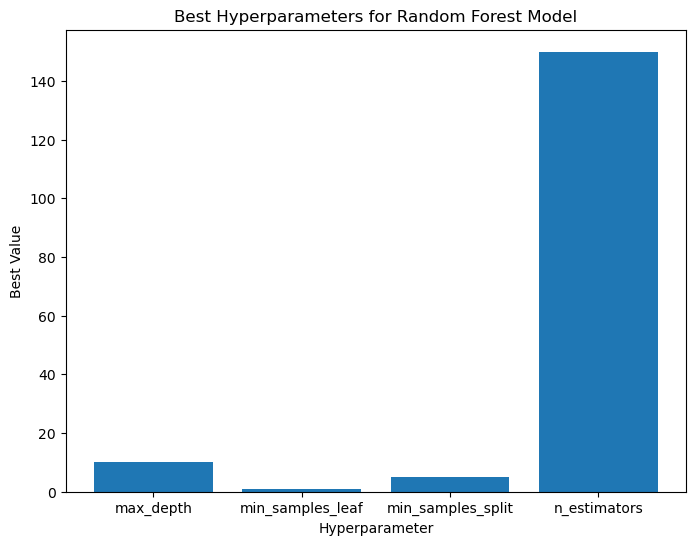

In [79]:
import matplotlib.pyplot as plt

# Define the hyperparameters and their corresponding scores
parameters = list(best_params_rf.keys())
best_values = list(best_params_rf.values())

# Plot the bar chart
plt.figure(figsize=(8, 6))
plt.bar(parameters, best_values)
plt.xlabel('Hyperparameter')
plt.ylabel('Best Value')
plt.title('Best Hyperparameters for Random Forest Model')
plt.show()

# Train a polynomial regression model with degrees 2, and 3 and compare its performance with other models 

In [80]:
from sklearn.preprocessing import PolynomialFeatures

In [81]:

poly_degrees = [2, 3]
for degree in poly_degrees:
    poly_features = PolynomialFeatures(degree=degree)
    X_train_poly = poly_features.fit_transform(X_train)
    X_test_poly = poly_features.transform(X_test)

    poly_model = LinearRegression()
    poly_model.fit(X_train_poly, y_train)
    y_pred_poly = poly_model.predict(X_test_poly)
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    mae_poly = mean_absolute_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    print(f"Polynomial Regression (Degree {degree})")
    print(f"MSE: {mse_poly:.2f}")
    print(f"MAE: {mae_poly:.2f}")
    print(f"R-squared: {r2_poly:.2f}")
    print("")

Polynomial Regression (Degree 2)
MSE: 0.13
MAE: 0.25
R-squared: 0.87

Polynomial Regression (Degree 3)
MSE: 0.12
MAE: 0.22
R-squared: 0.88



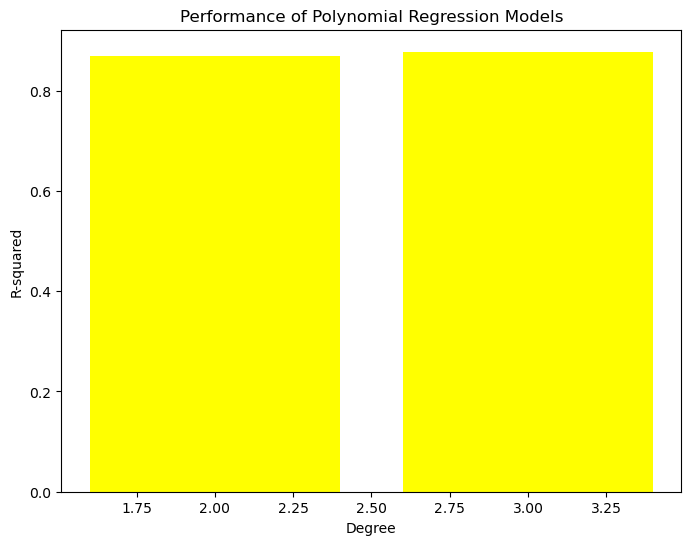

In [82]:
import matplotlib.pyplot as plt

degrees = [2, 3]
r2_scores = []

for degree in degrees:
    poly_features = PolynomialFeatures(degree=degree)
    X_train_poly = poly_features.fit_transform(X_train)
    X_test_poly = poly_features.transform(X_test)

    poly_model = LinearRegression()
    poly_model.fit(X_train_poly, y_train)
    y_pred_poly = poly_model.predict(X_test_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    r2_scores.append(r2_poly)

plt.figure(figsize=(8, 6))
plt.bar(degrees, r2_scores, color='yellow')
plt.xlabel("Degree")
plt.ylabel("R-squared")
plt.title("Performance of Polynomial Regression Models")

plt.show()
